# TSG-Bench & EASG Visualization Demo

This notebook demonstrates the visualization package for exploring:
- **SGQA samples** from TSG-Bench with context graph visualizations
- **EASG annotations** with F(t) keyframes and G(t) scene graphs

---

## TSG-Bench vs EASG Relationship

**Important**: TSG-Bench graphs are NOT copies of EASG graphs. They are text-transformed versions:

```
EASG (Video-Derived)                    TSG-Bench (Text-Derived)
═══════════════════                     ════════════════════════
                                        
Ego4D Videos                            
     │                                  
     ▼                                  
EASG Annotations ──► LLM Text Generation ──► Human Refinement
(6,250 graphs)                                      │
     │                                              ▼
     ▼                                  LLM Graph Regeneration
PRE/PNR/POST                                        │
Keyframes with                                      ▼
Bounding Boxes                          Human Graph Refinement
                                                    │
                                                    ▼
                                        TSG-Bench Graphs (4,289)
                                        (TEXT-ONLY, no frames)
```

## 1. Setup & Data Loading

In [1]:
# Import the visualization package
import sys
sys.path.insert(0, '/home/jtu9/sgg/tsg-bench')

from visualization import (
    # Data loading
    load_sgqa_samples,
    load_easg_annotations,
    
    # SGQA visualization
    visualize_sgqa_sample,
    visualize_random_sgqa_sample,
    display_context_graphs_visual,
    list_sgqa_samples,
    
    # EASG visualization
    browse_easg_clip,
    visualize_easg_graph,
    visualize_easg_sequence,
    list_easg_clips,
)

# Load data
sgqa_samples = load_sgqa_samples()
easg_data = load_easg_annotations()

Loaded 100 SGQA samples
Loaded EASG annotations for 221 clips


## 2. List Available Samples

In [2]:
# List first 10 SGQA samples
list_sgqa_samples(sgqa_samples, easg_data, limit=10)


Available SGQA Samples:
  0: [EASG] 19cc4e42-39bb-41f9-b9de-9f2940eed6a2 (11 graphs, 5 QA)
  1: [EASG] fbf4150a-27d2-48a4-956f-b4f85ecde465 (23 graphs, 5 QA)
  2: [EASG] 954c2f61-64ad-4c89-a26f-ec4547a65fab (19 graphs, 5 QA)
  3: [EASG] 277b18de-4ad9-4c09-970b-91fcea05097d (29 graphs, 5 QA)
  4: [EASG] e9be1118-a5cf-4431-b2e8-e3edcfa9f949 (32 graphs, 5 QA)
  5: [EASG] f5c27b88-a3eb-4290-9102-0307c2809241 (18 graphs, 5 QA)
  6: [EASG] 97ad4e58-c64f-47e3-8d84-6aad38bdfbc8 (19 graphs, 5 QA)
  7: [EASG] a20c2c22-cc2c-487e-8041-f0b33f4845ca (19 graphs, 5 QA)
  8: [EASG] 860980fb-f992-4bb1-8a46-b644f58090e2 (18 graphs, 5 QA)
  9: [EASG] 15d4a2c1-1cb8-4b76-a66a-adb20b7e96cb (14 graphs, 5 QA)

... and 90 more samples


In [3]:
# List first 10 EASG clips
list_easg_clips(easg_data, limit=10)


 AVAILABLE EASG CLIPS
Total clips: 221

  0: e9be1118-a5cf-4431-b2e8-e3edcfa9f949 (51 graphs, train)
  1: f5c27b88-a3eb-4290-9102-0307c2809241 (27 graphs, train)
  2: 19cc4e42-39bb-41f9-b9de-9f2940eed6a2 (7 graphs, train)
  3: 954c2f61-64ad-4c89-a26f-ec4547a65fab (44 graphs, train)
  4: fbf4150a-27d2-48a4-956f-b4f85ecde465 (1 graphs, train)
  5: 277b18de-4ad9-4c09-970b-91fcea05097d (17 graphs, train)
  6: 97ad4e58-c64f-47e3-8d84-6aad38bdfbc8 (32 graphs, train)
  7: a20c2c22-cc2c-487e-8041-f0b33f4845ca (34 graphs, train)
  8: 5293587a-e6c4-4760-8277-cf284588aac3 (78 graphs, train)
  9: ab5f1a57-29b3-4c07-bc82-bed0b1c3d42f (28 graphs, train)

... and 211 more clips


## 3. SGQA Sample Visualization

Visualize an SGQA sample with:
- Text representation of context graphs
- NetworkX visualization of ALL context graphs in a grid
- EASG keyframes (PRE/PNR/POST) with bounding boxes
- Q&A pairs


######################################################################
# TSG-Bench SGQA Sample #4
# Data ID (EASG clip_id): e9be1118-a5cf-4431-b2e8-e3edcfa9f949
# Number of context graphs: 32
# Number of Q&A pairs: 5
######################################################################

Context Graphs (32 actions):
[1] person → pick-up → screwdriver (with hand1)
[2] person → pick-up → screw (with hand2)
[3] person → position → screw (on wood, with hand2)
[4] person → screw → screw (into wood, with screwdriver, with hand1)
[5] person → put-down → screwdriver (from hand1)
[6] person → release → screw (from hand2)
[7] person → pick-up → clamp (with hand1, with hand2)
[8] person → position → clamp (on wood, with hand1, with hand2)
[9] person → tighten → clamp (with hand1, with hand2)
[10] person → loosen → clamp (with hand1, with hand2)
[11] person → remove → clamp (from wood, with hand1, with hand2)
[12] person → pick-up → wood (with hand1, with hand2)
[13] person → place → wood (on wor

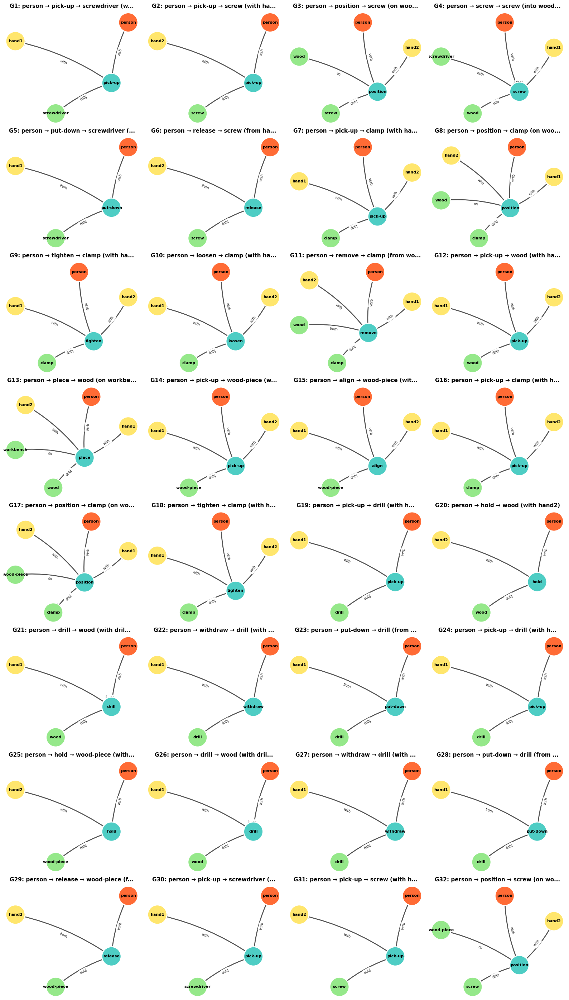


EASG Keyframes (Graph #0):
Note: These are EASG annotations, which differ from TSG-Bench graphs.


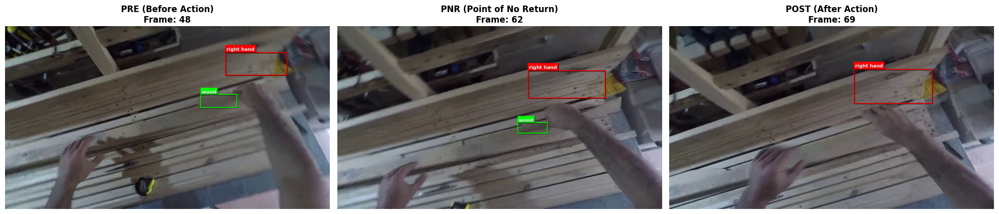


EASG Triplets for this graph:
  place --[dobj]--> wood
  place --[with]--> right hand
  CW --[verb]--> place

Q&A Pairs:

Q1: What tool was first picked up before any screwing action occurred?
A1: screwdriver

Q2: Which object was held in hand2 while the drill was being operated?
A2: wood

Q3: What tool was picked up immediately after the first clamp was removed?
A3: wood

Q4: Which object was positioned after both hands were used to pick up the clamp?
A4: clamp

Q5: What was the last tool picked up before the final positioning action?
A5: screw



In [4]:
# Visualize a specific SGQA sample
# This shows ALL context graphs as NetworkX visualizations
sample = visualize_sgqa_sample(
    sample_index=4,
    sgqa_samples=sgqa_samples,
    easg_data=easg_data,
    show_text=True,          # Show text representation
    show_visual=True,        # Show NetworkX graph grid
    show_keyframes=True,     # Show EASG keyframes
    show_qa=True,            # Show Q&A pairs
    context_graph_cols=4     # Number of columns in graph grid
)


Randomly selected sample index: 7

######################################################################
# TSG-Bench SGQA Sample #7
# Data ID (EASG clip_id): a20c2c22-cc2c-487e-8041-f0b33f4845ca
# Number of context graphs: 19
# Number of Q&A pairs: 5
######################################################################

Context Graphs (19 actions):
[1] person → pick-up → scissors (with hand1)
[2] person → hold → fabric (with hand2)
[3] person → cut → fabric (with scissors, with hand1)
[4] person → put-down → scissors (from hand1)
[5] person → release → fabric (with hand2)
[6] person → pick-up → glue (with hand1)
[7] person → apply → glue (with hand1, to fabric)
[8] person → smoothen → fabric (with hand2)
[9] person → put-down → glue (from hand1)
[10] person → pick-up → hammer (with hand1)
[11] person → pick-up → nail (with hand2)
[12] person → drive → nail (into furniture, with hammer, with hand1)
[13] person → adjust → fabric (with hand2)
[14] person → pick-up → nail (with hand2)
[

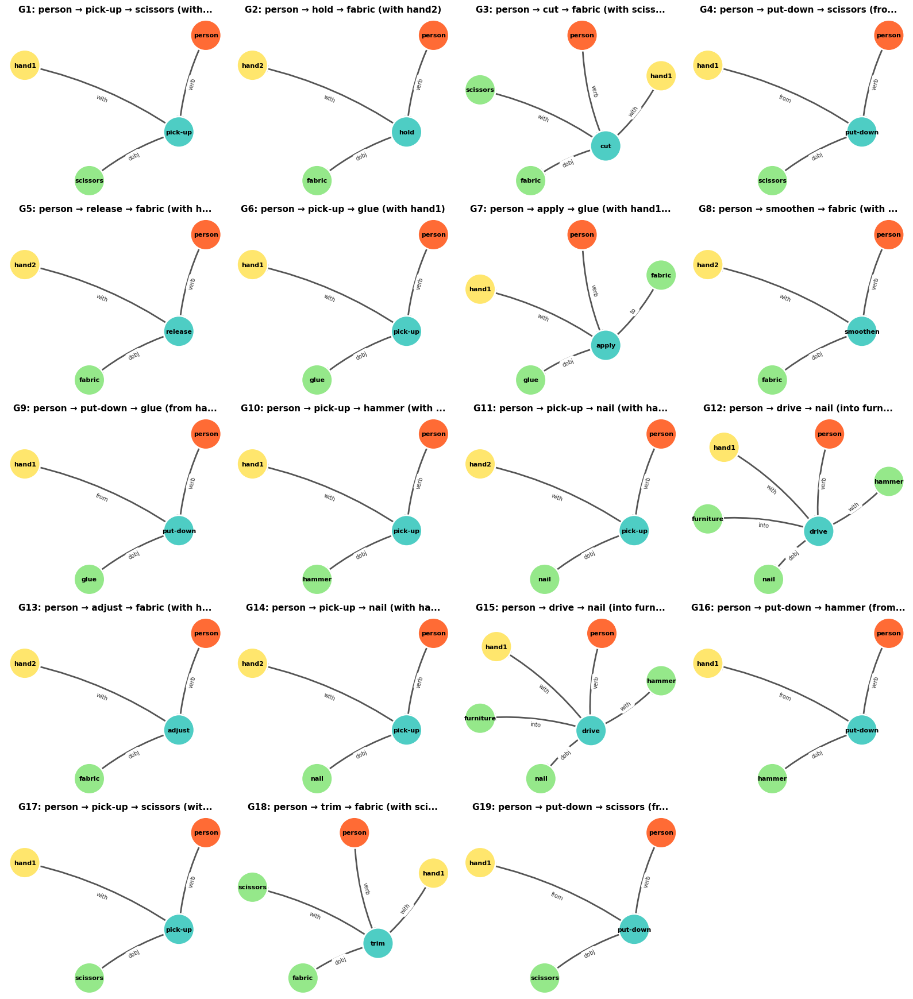


EASG Keyframes (Graph #0):
Note: These are EASG annotations, which differ from TSG-Bench graphs.


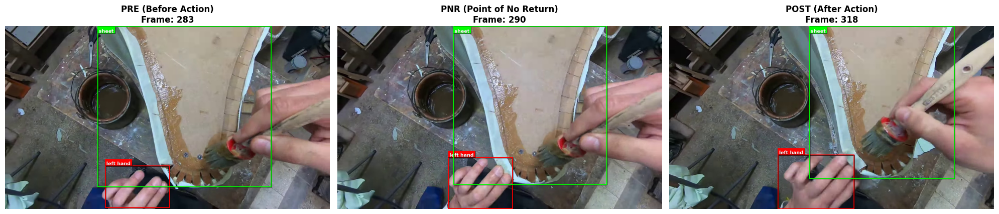


EASG Triplets for this graph:
  press --[with]--> left hand
  press --[dobj]--> sheet
  CW --[verb]--> press

Q&A Pairs:

Q1: What tool was used first before any fabric manipulation occurred?
A1: scissors

Q2: Which object was picked up immediately after the first scissors were put down?
A2: glue

Q3: What tool was used in conjunction with hand1 during the first furniture interaction?
A3: hammer

Q4: Which object was handled by hand2 during the parallel hammering operation?
A4: nail

Q5: What was the final tool used to modify the fabric after all furniture work was complete?
A5: scissors



In [5]:
# Visualize a random SGQA sample
sample, idx = visualize_random_sgqa_sample(
    sgqa_samples=sgqa_samples,
    easg_data=easg_data,
    show_visual=True,
    show_keyframes=True
)

Sample has 32 context graphs


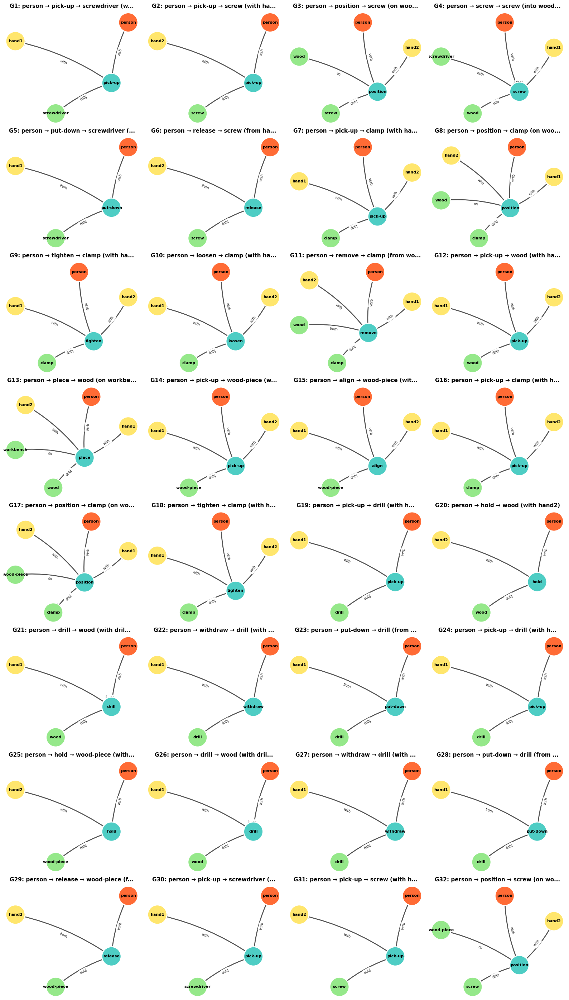

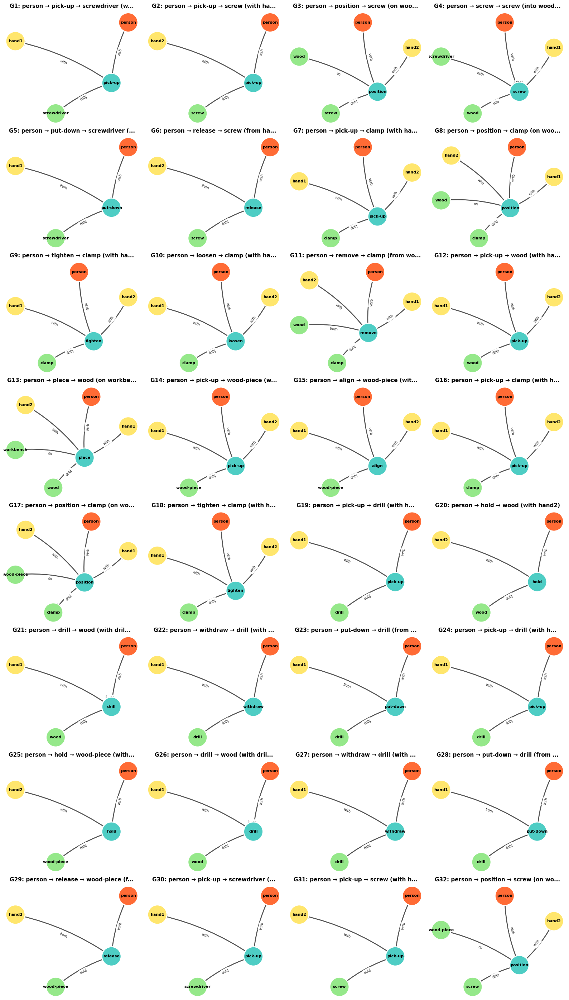

In [6]:
# Just visualize the context graphs grid (NetworkX)
sample = sgqa_samples[4]
context_graphs = sample['context_graphs']

print(f"Sample has {len(context_graphs)} context graphs")
display_context_graphs_visual(context_graphs, cols=4)

## 4. EASG Visualization with F(t) + G(t)

Visualize EASG annotations showing:
- F(t) keyframes (PRE, PNR, POST) with improved bounding boxes
- G(t) scene graph alongside each keyframe


 EASG CLIP BROWSER

Clip ID: e9be1118-a5cf-4431-b2e8-e3edcfa9f949
Total graphs in clip: 51
Video UID: 41416e77-3b9a-4685-bd1b-ba26b5ba19b2
Split: train

----------------------------------------
 ALL GRAPHS IN THIS CLIP
----------------------------------------
[ 0] place → wood
[ 1] place → wood
[ 2] place → wood
[ 3] place → wood
[ 4] pick → drill
[ 5] pick → drill ← CURRENT
[ 6] pick → clamp
[ 7] pick → clamp
[ 8] fix → clamp
[ 9] adjust → clamp
[10] pick → drill
[11] pick → drill
[12] pick → drill
[13] drill → wood
[14] drill → wood
[15] drill → wood
[16] withdraw → drill
[17] withdraw → drill
[18] drill → wood
[19] drill → wood
[20] place → drill
[21] drill → wood
[22] place → drill
[23] take → wood
[24] put down → wood
[25] take → wood
[26] take → wood
[27] place → wood
[28] place → wood
[29] fix up → clamp
[30] pick → drill
[31] drill → wood
[32] withdraw → drill
[33] withdraw → drill bit
[34] put → screw
[35] put → drill
[36] unknown
[37] place → drill
[38] place → drill
[39] dr

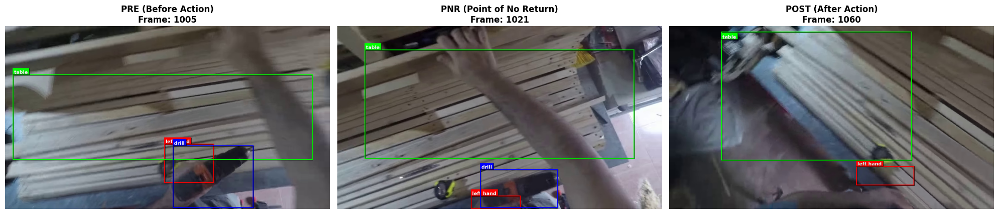


----------------------------------------
 SCENE GRAPH G(t)
----------------------------------------


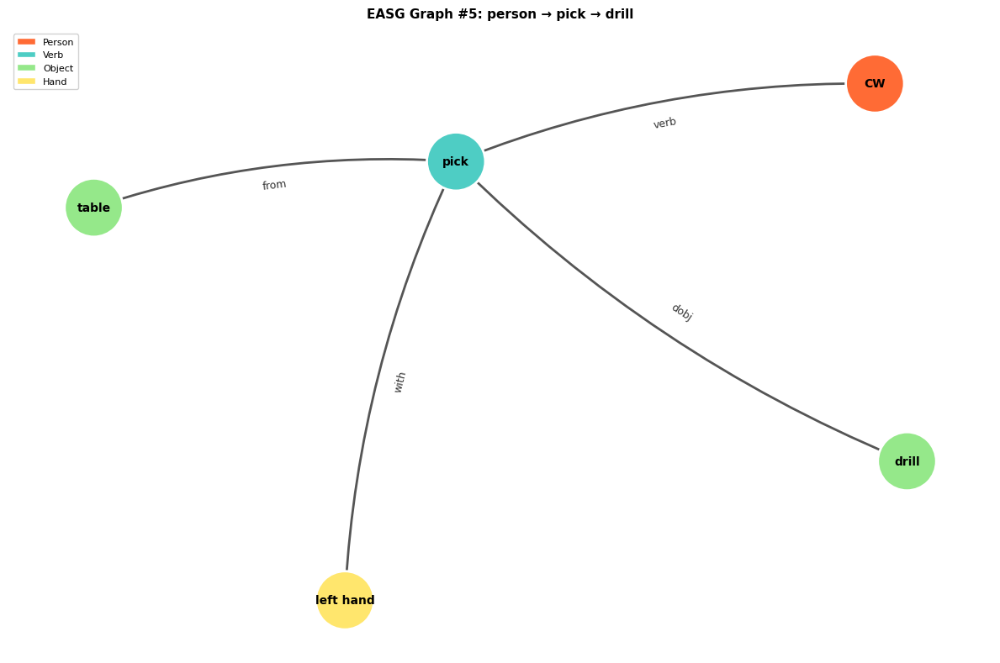

In [7]:
# Browse an EASG clip (shows keyframes and scene graph separately)
clip_id = 'e9be1118-a5cf-4431-b2e8-e3edcfa9f949'
graph = browse_easg_clip(
    clip_id=clip_id,
    easg_data=easg_data,
    graph_index=5,
    show_all_graphs=True
)

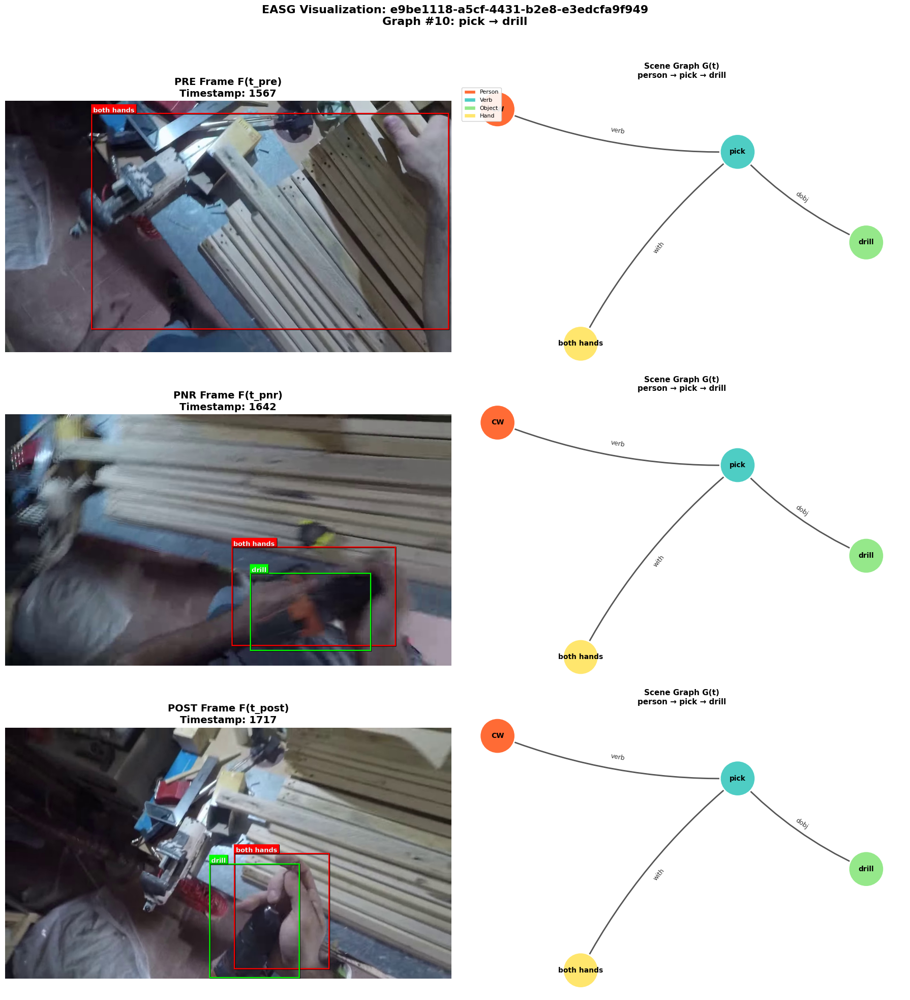

In [8]:
# Visualize EASG with F(t) + G(t) side-by-side
# This shows each keyframe (PRE/PNR/POST) with its corresponding scene graph
fig = visualize_easg_graph(
    clip_id=clip_id,
    graph_index=10,
    easg_data=easg_data
)

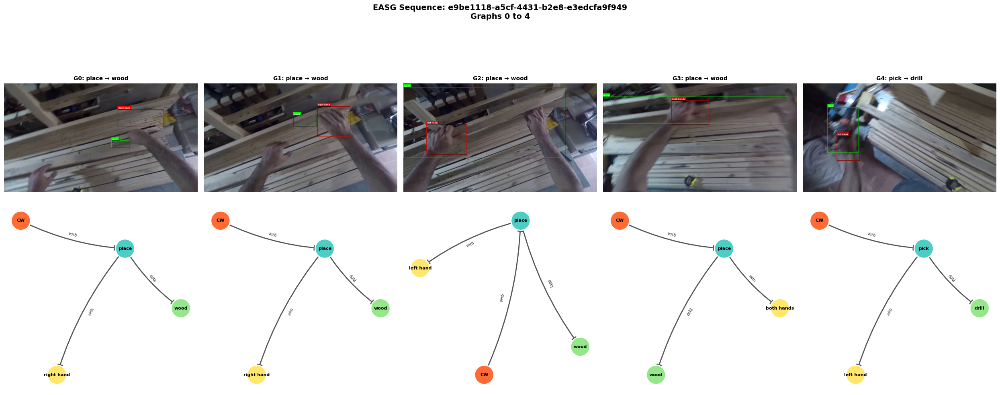

In [9]:
# Visualize a sequence of EASG graphs
# Shows PNR frames and scene graphs for consecutive actions
fig = visualize_easg_sequence(
    clip_id=clip_id,
    easg_data=easg_data,
    start_index=0,
    num_graphs=5
)

## 5. Compare Different Graph Indices

Explore different graphs within the same clip.


Graph #0


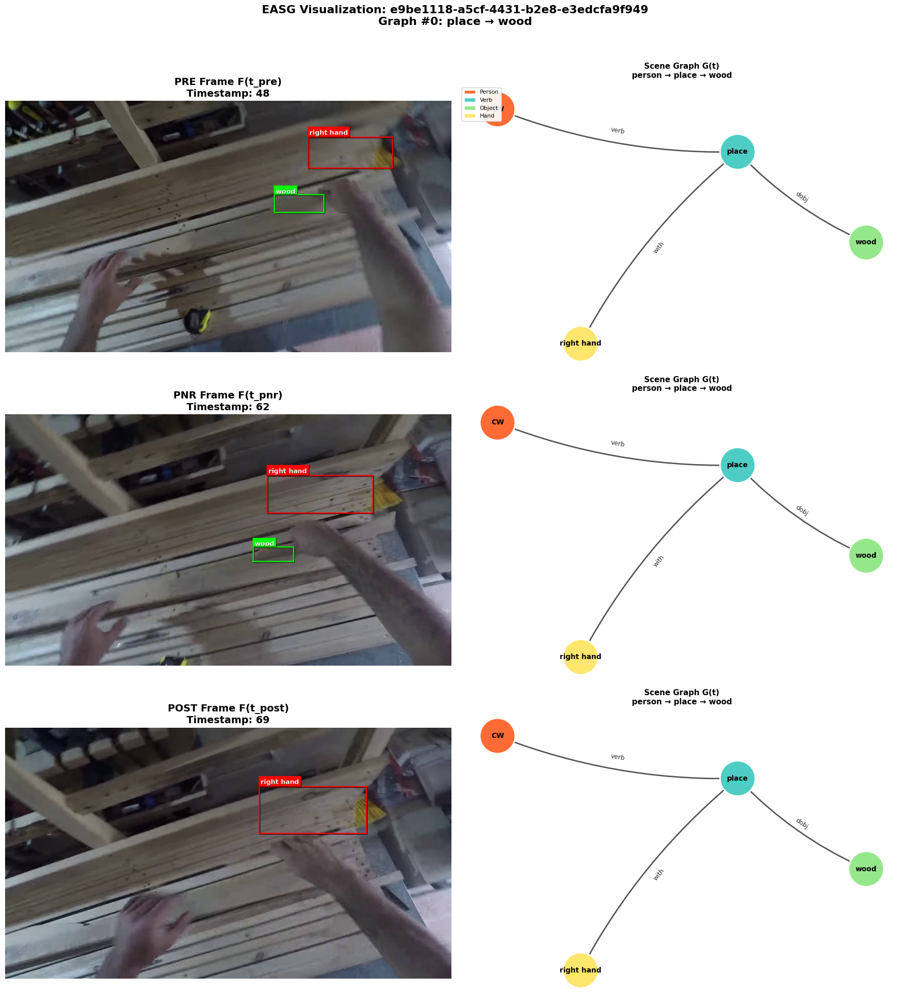


Graph #10


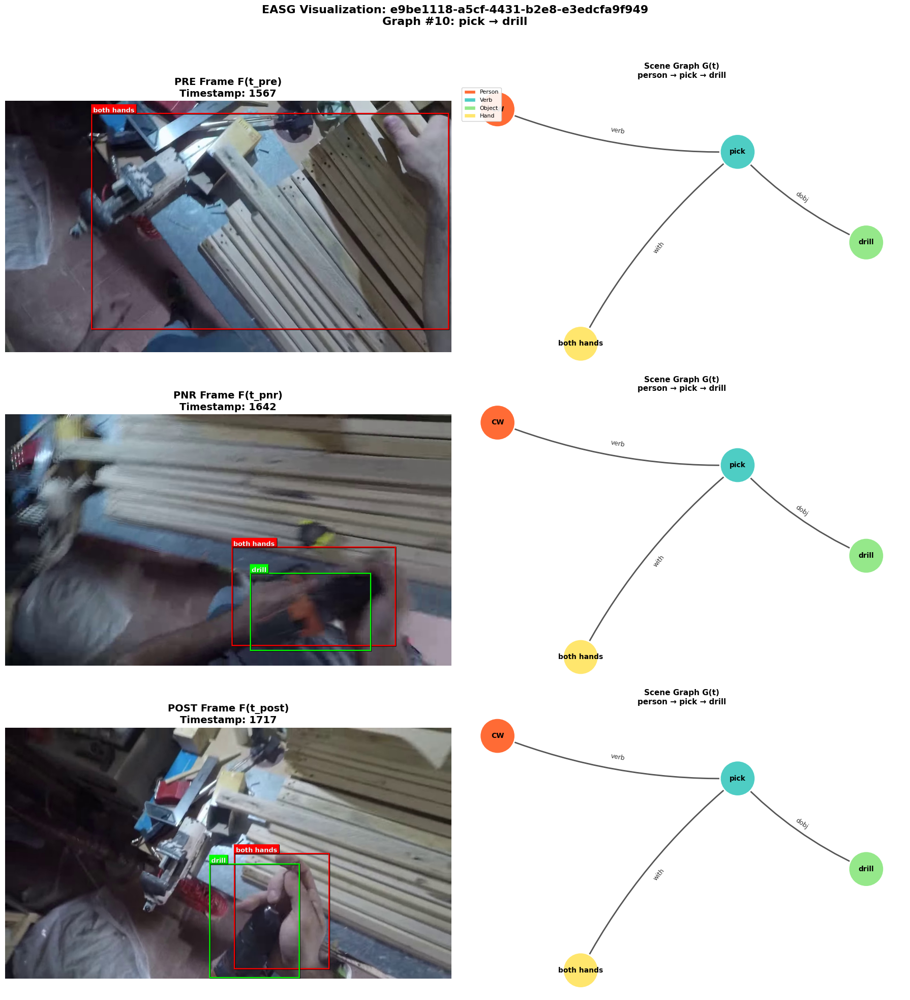


Graph #20


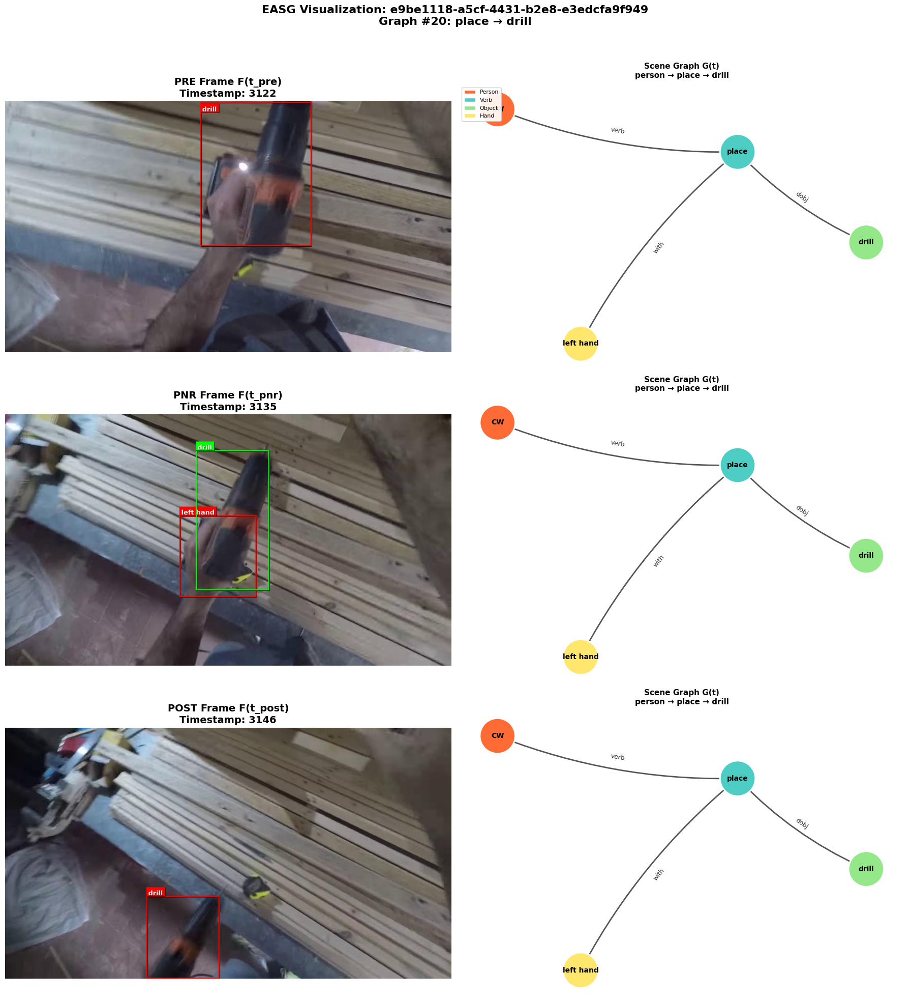


Graph #30


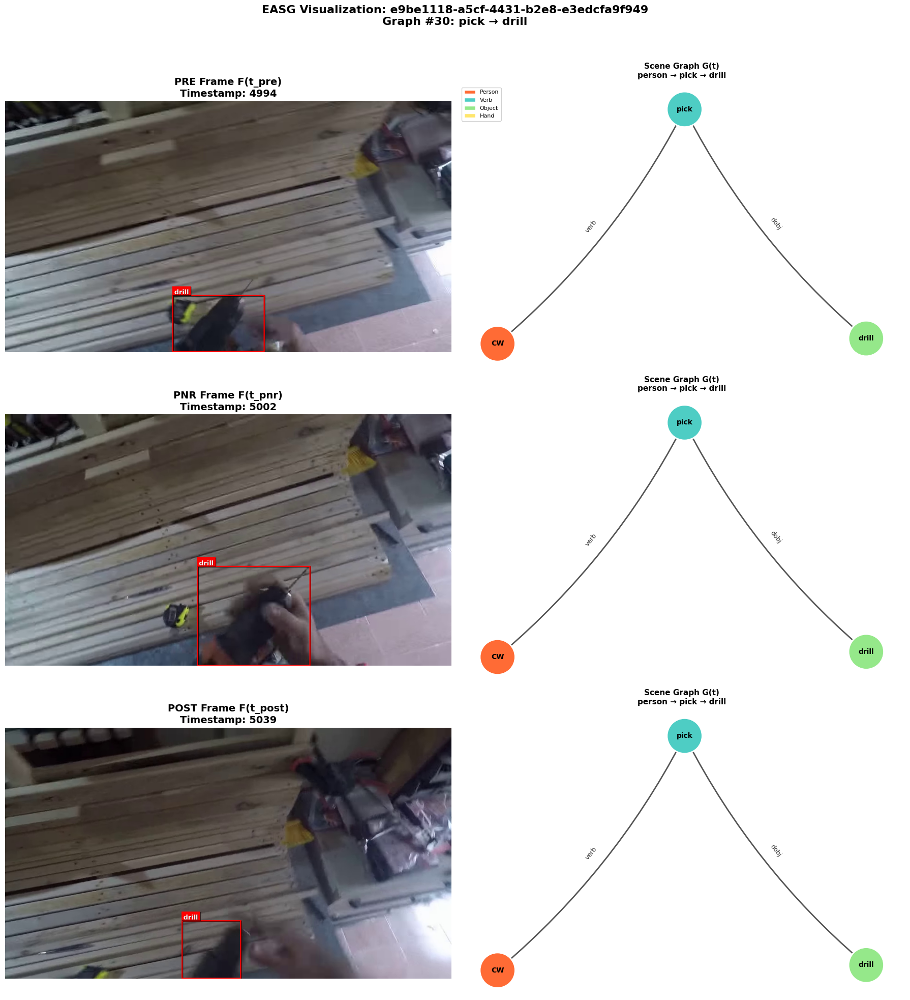

In [10]:
# Compare graphs at different indices
for graph_idx in [0, 10, 20, 30]:
    print(f"\n{'='*60}")
    print(f"Graph #{graph_idx}")
    print(f"{'='*60}")
    fig = visualize_easg_graph(
        clip_id=clip_id,
        graph_index=graph_idx,
        easg_data=easg_data
    )

## 6. Custom Visualization

Use lower-level functions for custom visualizations.

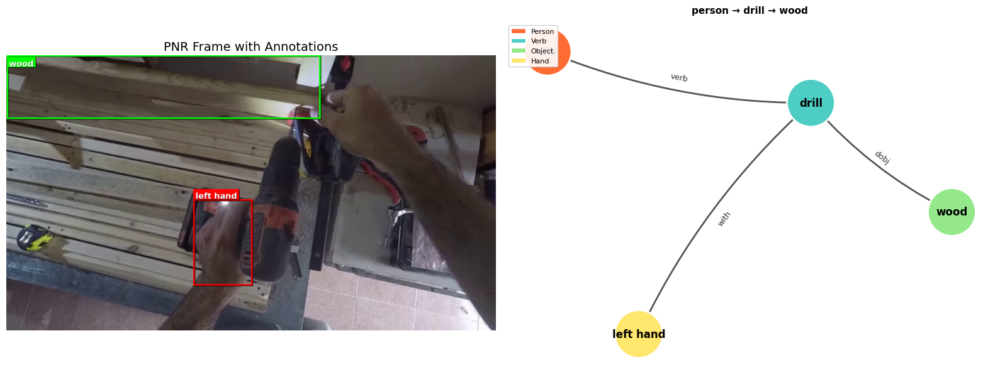

In [11]:
from visualization import (
    get_graph_frames,
    draw_bounding_boxes,
    draw_scene_graph,
    format_graph_as_text
)
import matplotlib.pyplot as plt

# Get frame info for a specific graph
frame_info = get_graph_frames(clip_id, 15, easg_data)

if frame_info:
    # Create custom visualization
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Left: PNR frame with bounding boxes
    img = draw_bounding_boxes(
        frame_info['pnr'],
        frame_info['groundings'],
        'pnr',
        font_size=32,  # Extra large text
        line_width=6    # Thick lines
    )
    if img:
        axes[0].imshow(img)
        axes[0].set_title('PNR Frame with Annotations', fontsize=14)
    axes[0].axis('off')
    
    # Right: Scene graph
    draw_scene_graph(
        frame_info['triplets'],
        title=format_graph_as_text(frame_info['triplets']),
        ax=axes[1],
        node_size=3000,
        font_size=12
    )
    
    plt.tight_layout()
    plt.show()

## Summary

This visualization package provides:

1. **SGQA Visualization**
   - `visualize_sgqa_sample()` - Full sample with context graphs, keyframes, Q&A
   - `visualize_random_sgqa_sample()` - Random sample exploration
   - `display_context_graphs_visual()` - NetworkX grid of context graphs

2. **EASG Visualization**
   - `browse_easg_clip()` - Browse clips with graph listings
   - `visualize_easg_graph()` - F(t) keyframes + G(t) scene graphs side-by-side
   - `visualize_easg_sequence()` - Sequence of actions

3. **Improved Bounding Boxes**
   - Larger fonts (28pt default)
   - Thicker lines (5px default)
   - Better contrast with shadows

4. **Modular Design**
   - `config.py` - All paths and settings
   - `data_loader.py` - Data loading functions
   - `graph_viz.py` - NetworkX visualizations
   - `keyframe_viz.py` - Keyframe display
   - `sgqa_viz.py` - SGQA-specific functions
   - `easg_viz.py` - EASG-specific functions